In [15]:
%load_ext autoreload
%autoreload 2

In [43]:
from os.path import join
import pandas as pd
import numpy as np
from numpy.linalg import inv
from numpy.random import seed
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from silhouette_plot import plot_silhouette, plot2d_cluster_assignments, plot3d_cluster_assignments, format_silhouette_plot, metric_plot_update, format3D
from jupyterthemes import jtplot

In [44]:
jtplot.style(theme='onedork', context='talk', fscale=1.4, spines=False, 
             gridlines='--', ticks=True, grid=False, figsize=(7, 5))
%matplotlib notebook
pd.options.display.float_format = '{:,.2f}'.format
seed(42)

### Load the transaction data

In [85]:
data = pd.read_csv(join('data', 'wholesale_customers_data.csv'))
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
Channel             440 non-null int64
Region              440 non-null int64
Fresh               440 non-null int64
Milk                440 non-null int64
Grocery             440 non-null int64
Frozen              440 non-null int64
Detergents_Paper    440 non-null int64
Delicatessen        440 non-null int64
dtypes: int64(8)
memory usage: 27.6 KB


### And review the first few rows

In [19]:
data.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [20]:
products = ['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicatessen']

#### There's a wide range of transaction values

<IPython.core.display.Javascript object>


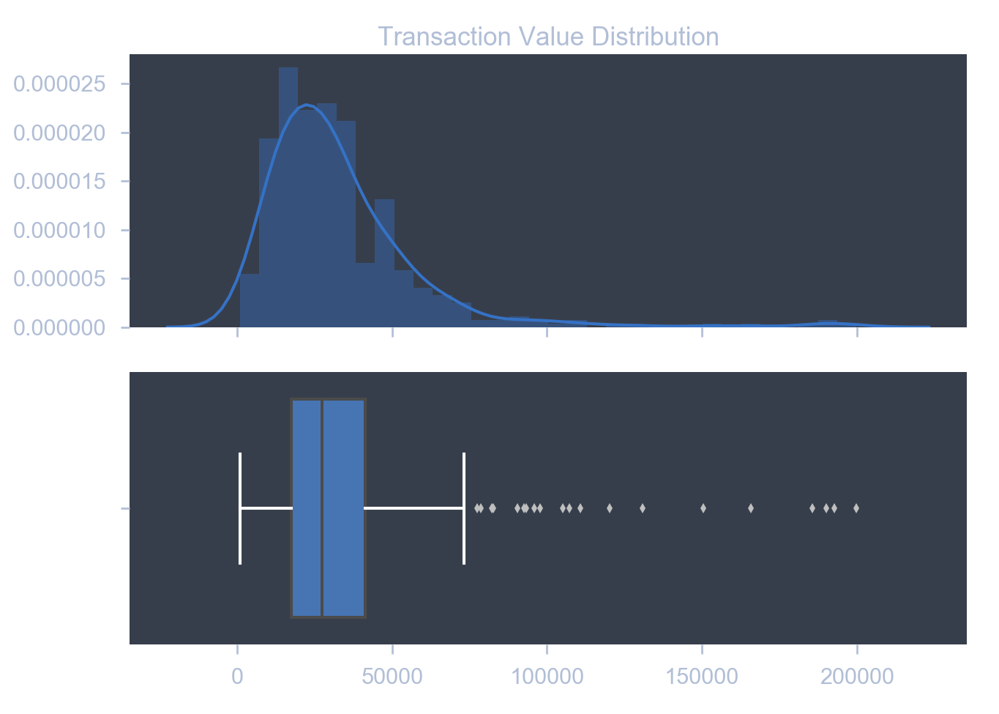

In [78]:
fig, axes = plt.subplots(nrows=2, sharex=True)
transaction_value = data.loc[:, products].sum(axis=1)
sns.distplot(transaction_value, ax=axes[0])
flierprops = dict(markerfacecolor='0.75', markersize=5, linestyle='none')
whiskerprops = capprops = dict(c='white')
sns.boxplot(transaction_value, ax=axes[1], 
    flierprops=flierprops, whiskerprops=whiskerprops, capprops=capprops)
axes[0].set_title('Transaction Value Distribution')
plt.tight_layout();

### And plenty of outliers for each product

<IPython.core.display.Javascript object>


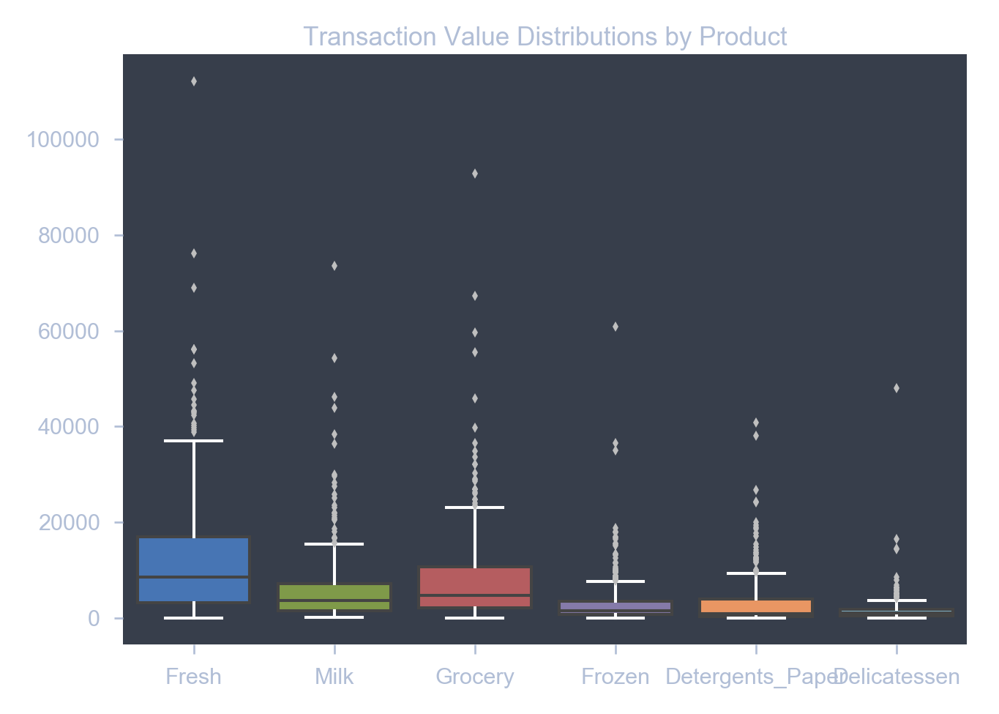

In [79]:
plt.figure()
sns.boxplot(data=data[products], 
    flierprops=flierprops, whiskerprops=whiskerprops, capprops=capprops)
plt.title('Transaction Value Distributions by Product')
plt.tight_layout();

### Sampling Customer Profiles

#### Let's sample 5 customers

In [23]:
sample = data.sample(5).reset_index(drop=True)
sample_with_stats = sample.append(data.agg(['median', 'mean']))
sample_with_stats

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,1.00,1.00,"5,909.00","23,527.00","13,699.00","10,155.00",830.00,"3,636.00"
1,1.00,3.00,"10,766.00","1,175.00","2,067.00","2,096.00",301.00,167.00
2,2.00,3.00,"27,380.00","7,184.00","12,311.00","2,809.00","4,621.00","1,022.00"
3,1.00,1.00,"31,614.00",489.00,"1,495.00","3,242.00",111.00,615.00
4,1.00,2.00,542.00,899.00,"1,664.00",414.00,88.00,522.00
median,1.00,3.00,"8,504.00","3,627.00","4,755.50","1,526.00",816.50,965.50
mean,1.32,2.54,"12,000.30","5,796.27","7,951.28","3,071.93","2,881.49","1,524.87"


#### And plot the transaction profiles

<IPython.core.display.Javascript object>


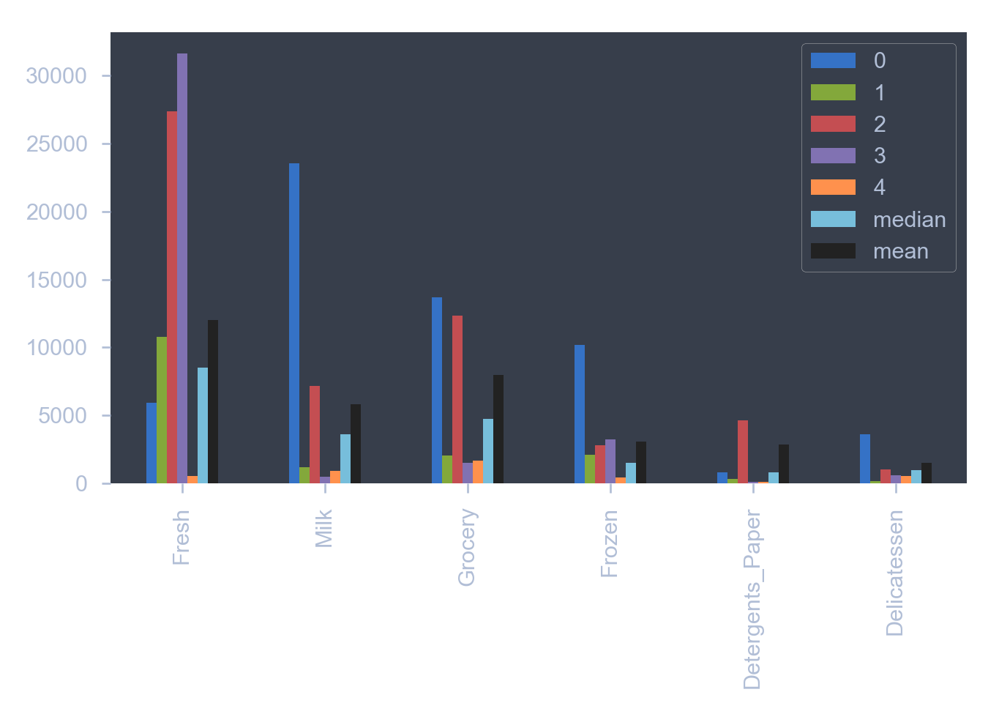

In [80]:
sample_with_stats[products].T.plot.bar()
plt.tight_layout();

### Basket Shares

In [25]:
product_sales = data[products]
basket_shares = product_sales.div(product_sales.sum(axis=1), axis=0)

<IPython.core.display.Javascript object>


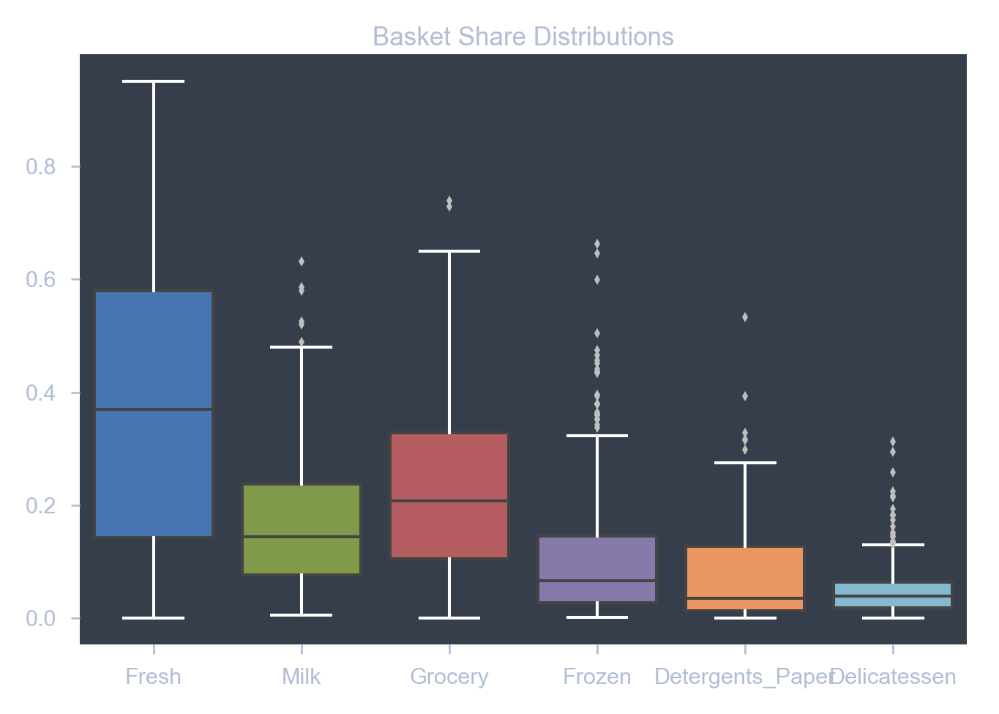

In [81]:
plt.figure()
sns.boxplot(data=basket_shares, 
    flierprops=flierprops, whiskerprops=whiskerprops, capprops=capprops)
plt.title('Basket Share Distributions')
plt.tight_layout();

<IPython.core.display.Javascript object>


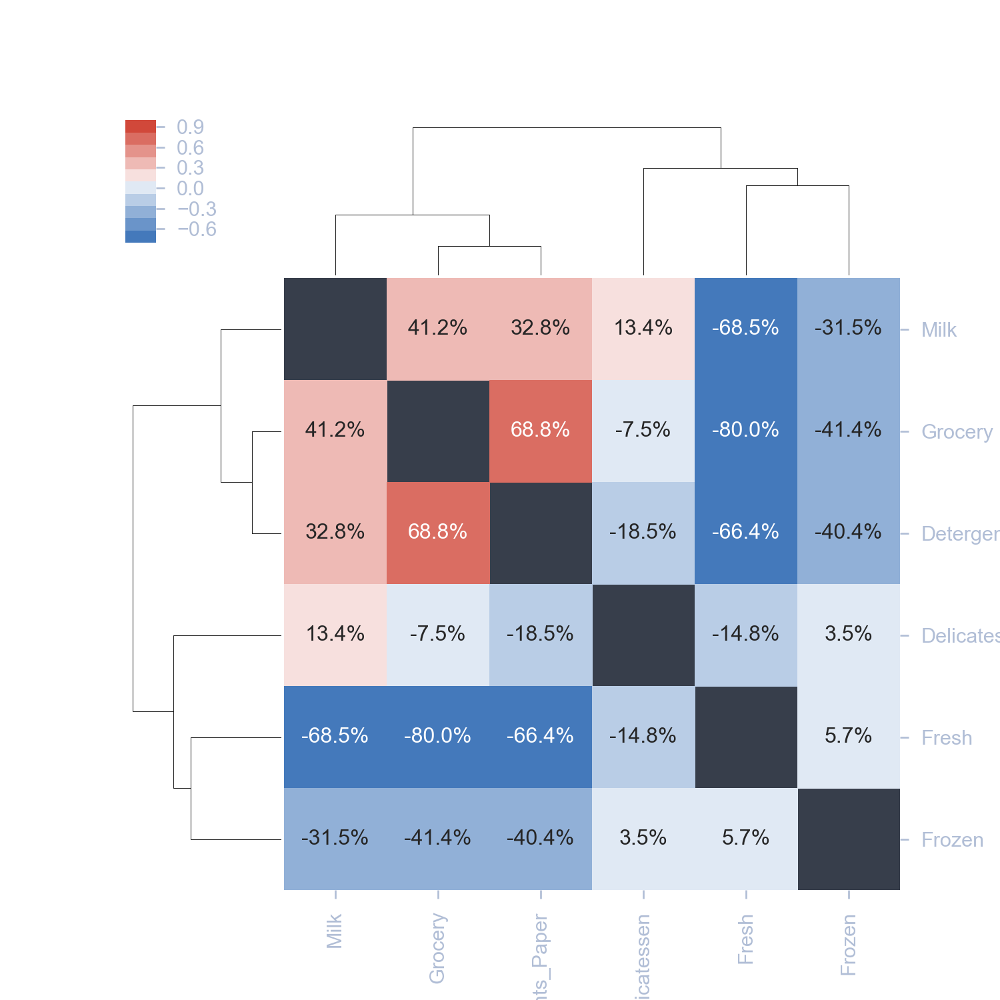

In [82]:
corr_matrix = basket_shares.corr()
mask = np.zeros_like(corr_matrix)
np.fill_diagonal(mask, 1)
sns.clustermap(corr_matrix, annot=True, fmt='.1%', 
        cmap=sns.diverging_palette(250, 15, n=10), mask=mask);

#### and compare the share of each product in their purchase

In [28]:
sample_profile = basket_shares.loc[sample.index]
sample_profile_with_stats = sample_profile.append(
    basket_shares.agg(['median', 'mean']))
sample_profile_with_stats

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,0.37,0.28,0.22,0.01,0.08,0.04
1,0.21,0.29,0.29,0.05,0.10,0.05
2,0.17,0.24,0.21,0.07,0.10,0.21
3,0.48,0.04,0.15,0.23,0.02,0.07
4,0.49,0.12,0.16,0.08,0.04,0.11
median,0.37,0.14,0.21,0.07,0.03,0.04
mean,0.38,0.17,0.23,0.11,0.07,0.05


#### visualize as horizontal bar chart and heatmap

<IPython.core.display.Javascript object>


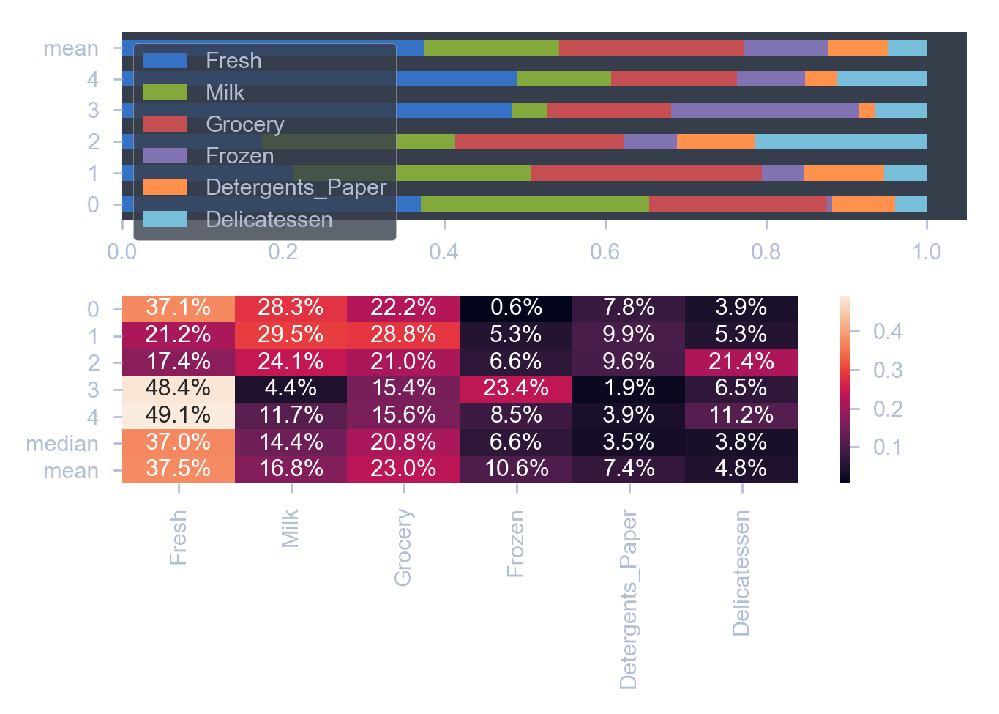

In [83]:
fig, axes = plt.subplots(nrows=2)
sample_profile_with_stats.drop('median').plot.barh(
    stacked=True, ax=axes[0])
sns.heatmap(sample_profile_with_stats, ax=axes[1], annot=True, fmt='.1%')
plt.tight_layout();

### Sales by Region

<IPython.core.display.Javascript object>


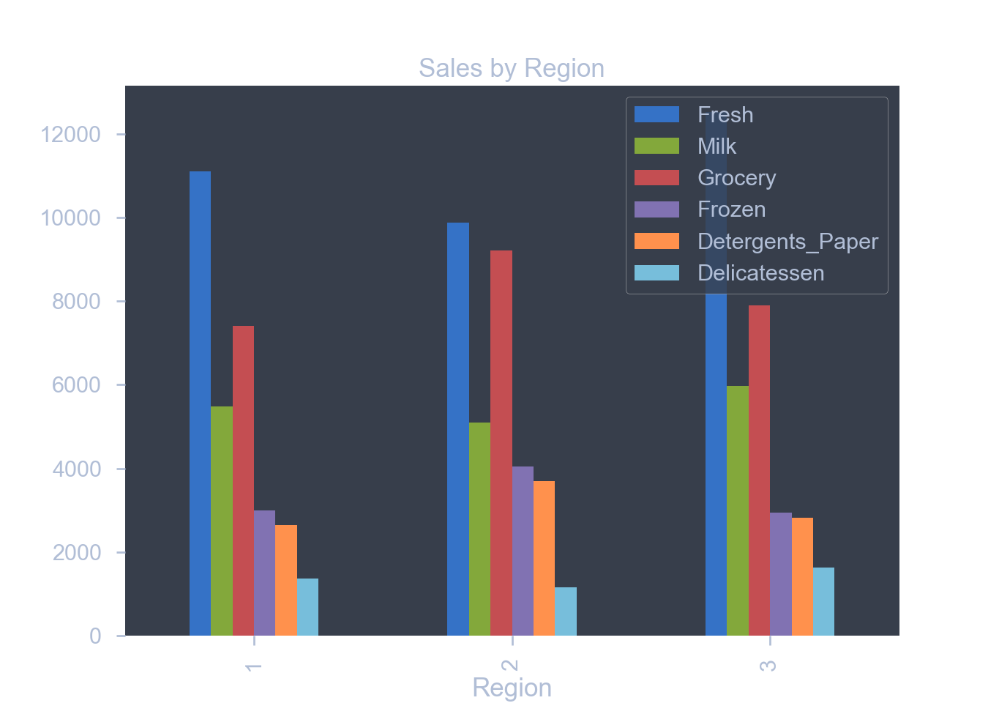

In [86]:
data.groupby('Region')[products].mean().plot.bar(title='Sales by Region');

### Sales by Channel

<IPython.core.display.Javascript object>


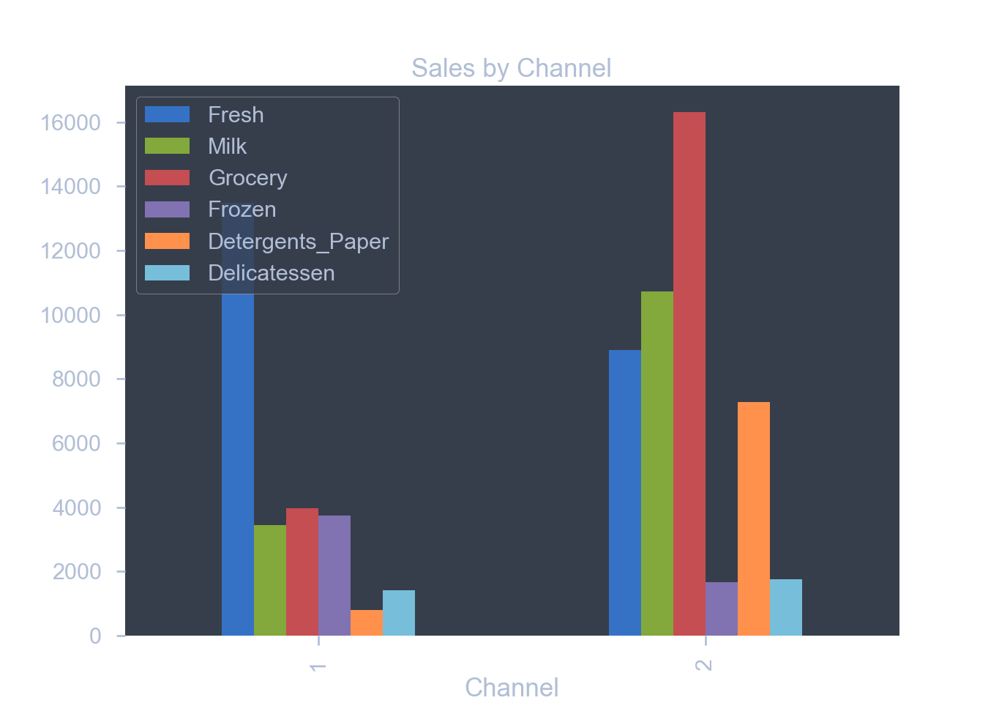

In [87]:
data.groupby('Channel')[products].mean().plot.bar(
    title='Sales by Channel');

### Using categorical variables

In [88]:
pd.get_dummies(data, columns=['Channel', 'Region']).head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,Channel_1,Channel_2,Region_1,Region_2,Region_3
0,12669,9656,7561,214,2674,1338,0,1,0,0,1
1,7057,9810,9568,1762,3293,1776,0,1,0,0,1
2,6353,8808,7684,2405,3516,7844,0,1,0,0,1
3,13265,1196,4221,6404,507,1788,1,0,0,0,1
4,22615,5410,7198,3915,1777,5185,0,1,0,0,1


In [89]:
data.Channel = data.Channel.sub(1)

In [90]:
data = data.drop('Region', axis=1)

### KMeans with raw data

#### Compute Principal Components to facilitate 2D visualization

In [50]:
def get_components(data):
    pca = PCA().fit(data)
    C2 = pca.components_[:2].T # for 2D projection
    C3 = pca.components_[:3].T # for 3D projection
    data2d, data3d = data.dot(C2), data.dot(C3)
    return C2, C3, data2d, data3d, pca.explained_variance_ratio_

#### Evaluate 1-10 Clusters

In [51]:
def create_figure(max_clusters):
    ncols, nrows = 3, max_clusters
    fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                             figsize=(12, nrows * 3))
    for row in range(1, max_clusters):
        axes[row, 2].remove()
        axes[row, 2] = format3D(fig.add_subplot(nrows, ncols, 3 + row * 3, projection='3d'))
    return fig, axes

In [52]:
def evaluate_clusters(data, max_clusters=6):
    cluster_list = list(range(2, max_clusters + 1))
    inertias = pd.Series(index=cluster_list)
    silhouette_scores = inertias.copy()

    C2, C3, data2d, data3d, ev = get_components(data)
    
    fig, axes = create_figure(max_clusters)
    pd.Series(ev, 
            index=list(range(1, data.shape[1] + 1)))\
            .plot.bar(title='PCA Explained Variance', ax= axes[0][2]);
    for n_cluster in cluster_list:
        kmeans = KMeans(n_clusters=n_cluster, random_state=42).fit(data)
        centroids, assignments, inertia = \
            kmeans.cluster_centers_, kmeans.labels_, kmeans.inertia_
        inertias[n_cluster] = inertia
        metric_plot_update(inertias, fig, axes[0][0])

        silhouette_avg = silhouette_score(data, assignments)
        silhouette_scores[n_cluster] = silhouette_avg
        metric_plot_update(silhouette_scores, fig, axes[0][1], 
                           kind='bar', title='Silhouette Scores')
        silhouette_values = silhouette_samples(data, assignments)
        silhouette_plot, cluster_plot2d, clusterplot3d = axes[n_cluster - 1]

        y_lower = 10
        for i in range(n_cluster):
            y_lower = plot_silhouette(np.sort(
                silhouette_values[assignments == i]), 
                y_lower, i, n_cluster, silhouette_plot)
        format_silhouette_plot(silhouette_plot, silhouette_avg)
        plot2d_cluster_assignments(*data2d.T, 
                centroids.dot(C2), assignments, n_cluster, cluster_plot2d)
        plot3d_cluster_assignments(*data3d.T, 
                centroids.dot(C3), assignments, n_cluster, clusterplot3d)
        fig.tight_layout()

    fig.suptitle('KMeans Silhouette Plot with Wholesale Data', 
                 fontsize=14)
    fig.tight_layout()
    fig.subplots_adjust(top=.95)

<IPython.core.display.Javascript object>


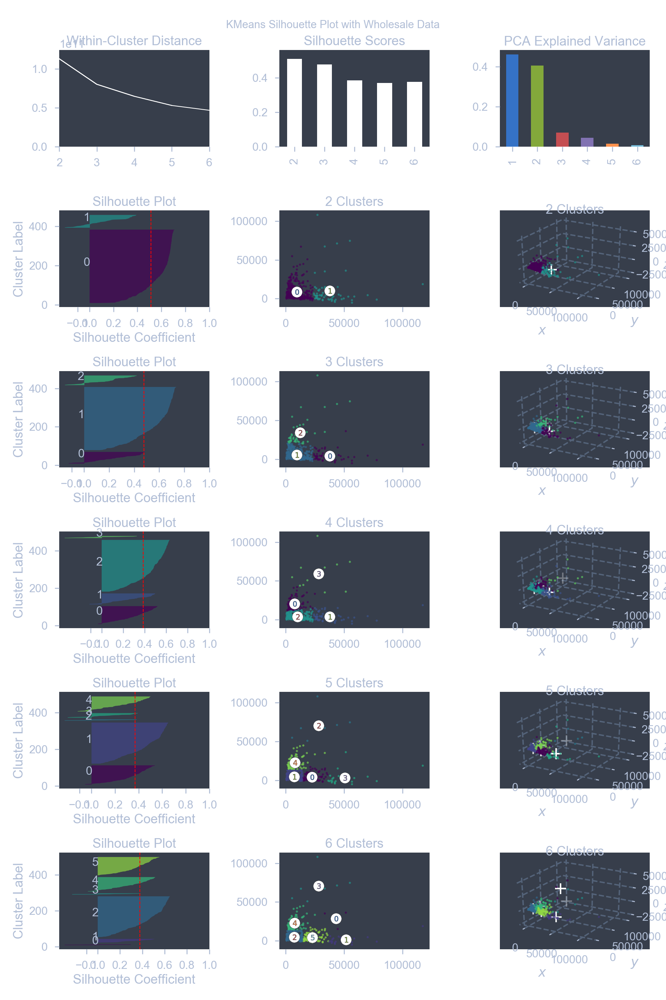

In [53]:
evaluate_clusters(product_sales.values)

### Evaluate standardized raw data

<IPython.core.display.Javascript object>


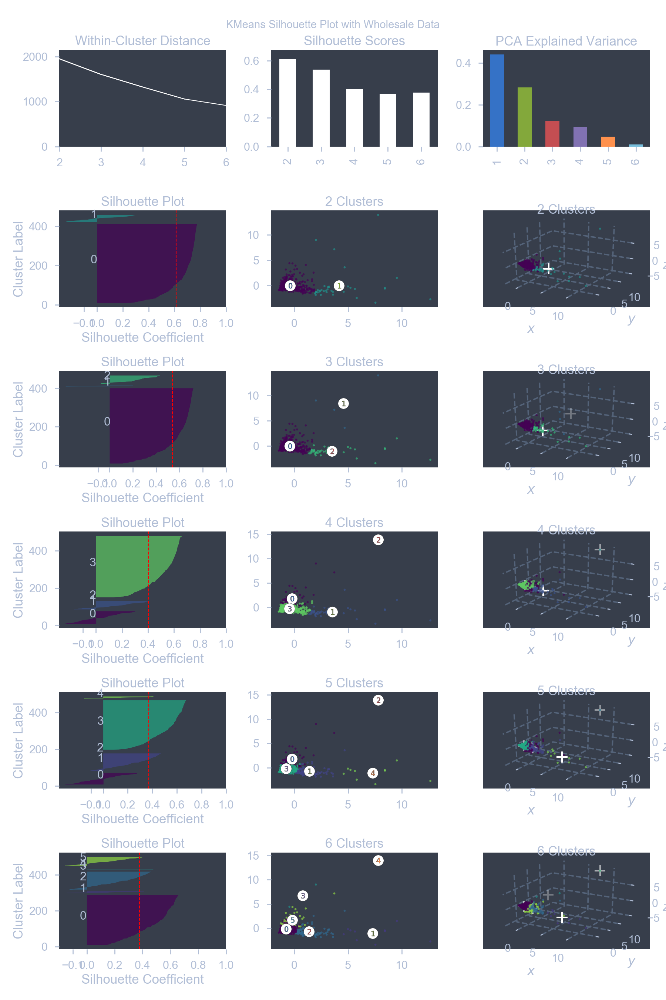

In [54]:
scaler = StandardScaler()
standardized_data = scaler.fit_transform(product_sales)
evaluate_clusters(standardized_data)

### Evaluate log-transformed Data

<IPython.core.display.Javascript object>


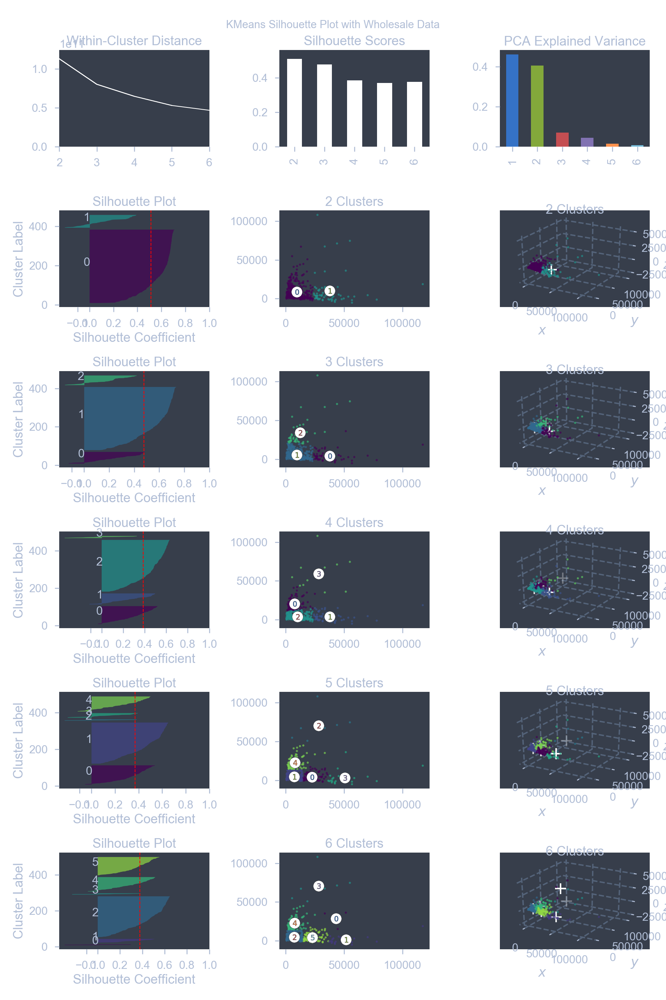

In [55]:
log_sales = product_sales.apply(np.log)
evaluate_clusters(product_sales.values)

### Evaluate standardized log-transformed Data

<IPython.core.display.Javascript object>


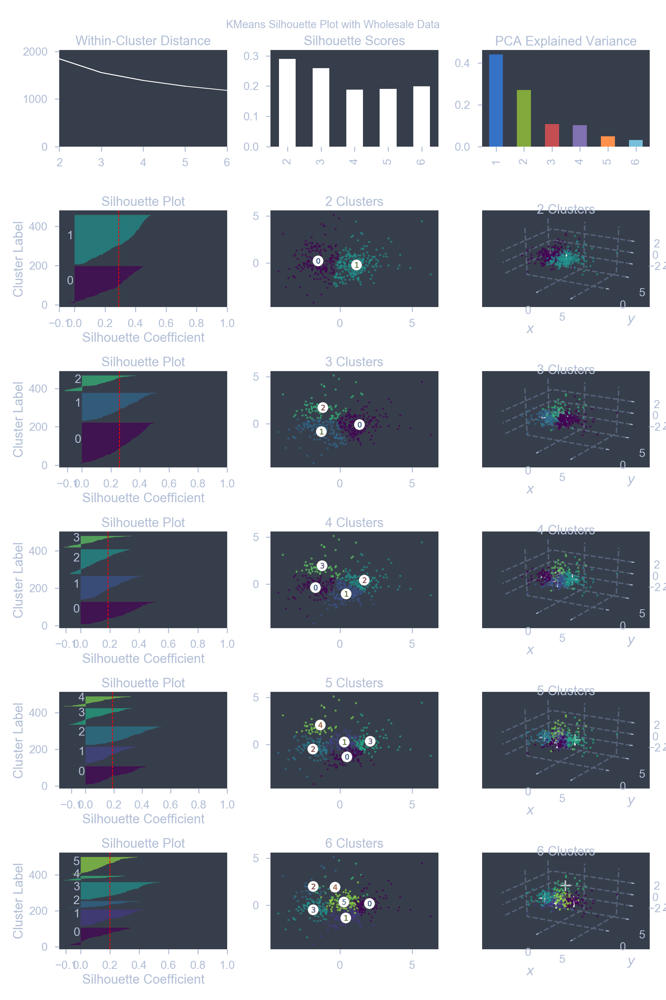

In [56]:
log_sales_standardized = scaler.fit_transform(log_sales)
evaluate_clusters(log_sales_standardized)

### Add Channel Information

<IPython.core.display.Javascript object>


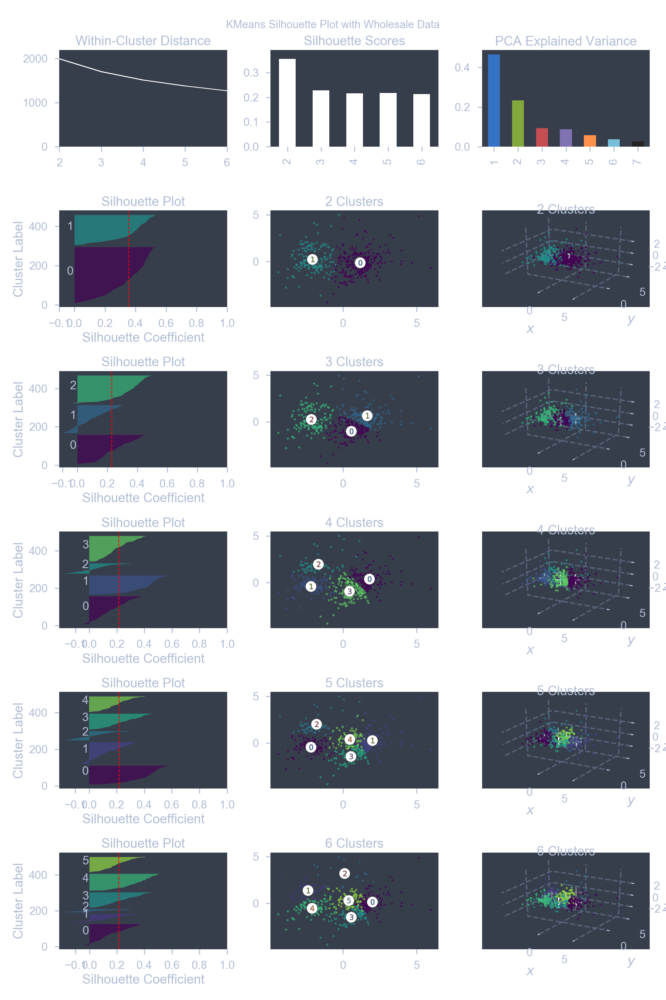

In [57]:
log_sales_channel = log_sales.join(data.Channel)
log_sales_channel_standardized = scaler.fit_transform(log_sales_channel)
evaluate_clusters(log_sales_channel_standardized)

### Remove Outliers

<IPython.core.display.Javascript object>


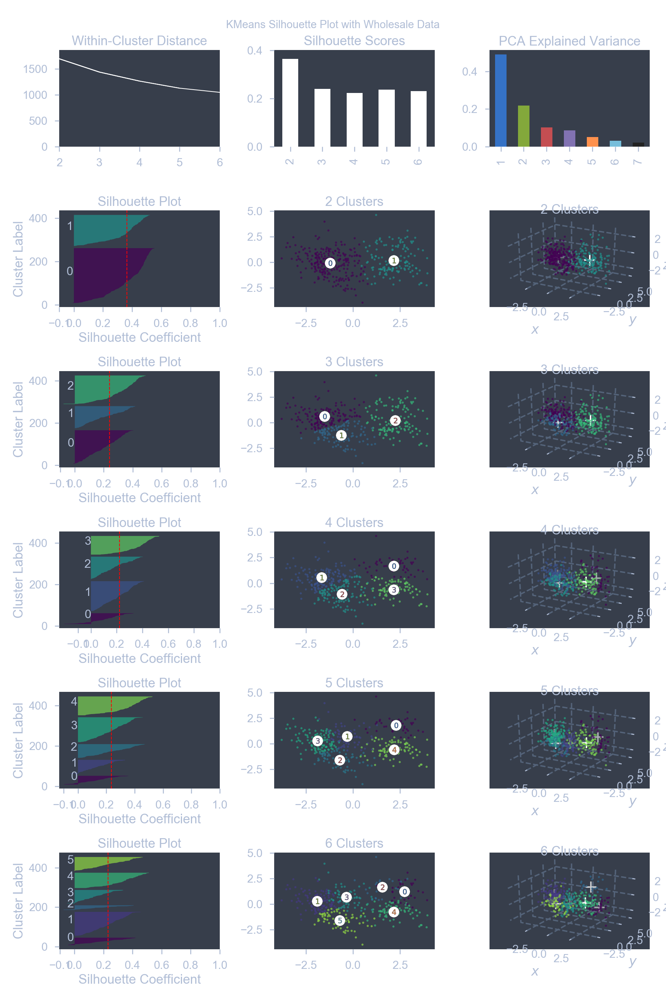

In [58]:
outliers = LocalOutlierFactor(n_neighbors=20, contamination=.1)
log_sales_channel['inlier'] = outliers.fit_predict(log_sales_channel)
log_sales_channel_clean = log_sales_channel.loc[log_sales_channel.inlier==1].drop('inlier', axis=1)

log_sales_channel_clean_standardized = scaler.fit_transform(log_sales_channel_clean)
evaluate_clusters(log_sales_channel_clean_standardized)

### Evaluate basket share data

<IPython.core.display.Javascript object>


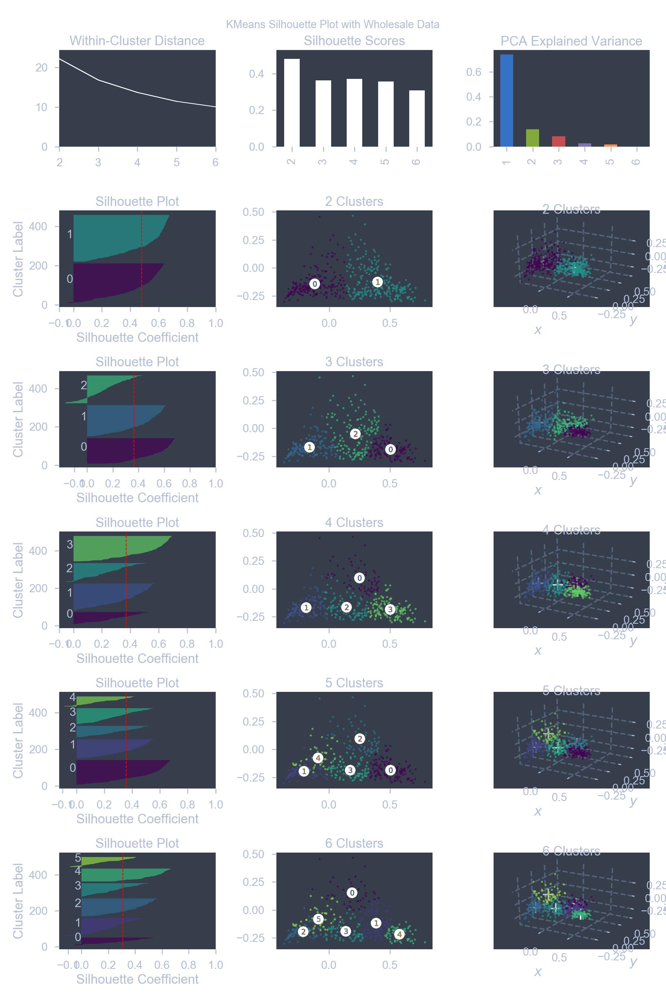

In [59]:
evaluate_clusters(basket_shares.values)

### Evaluate Standardized Basket Shares

<IPython.core.display.Javascript object>


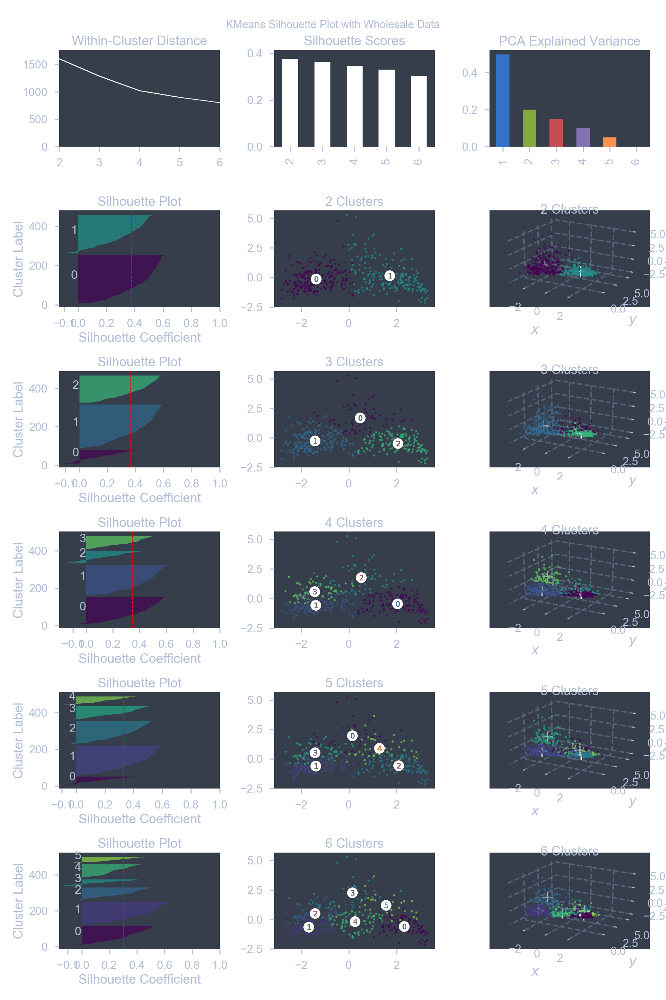

In [60]:
basket_shares_standardized = scaler.fit_transform(basket_shares)
evaluate_clusters(basket_shares_standardized)

### Include Channel Information

<IPython.core.display.Javascript object>


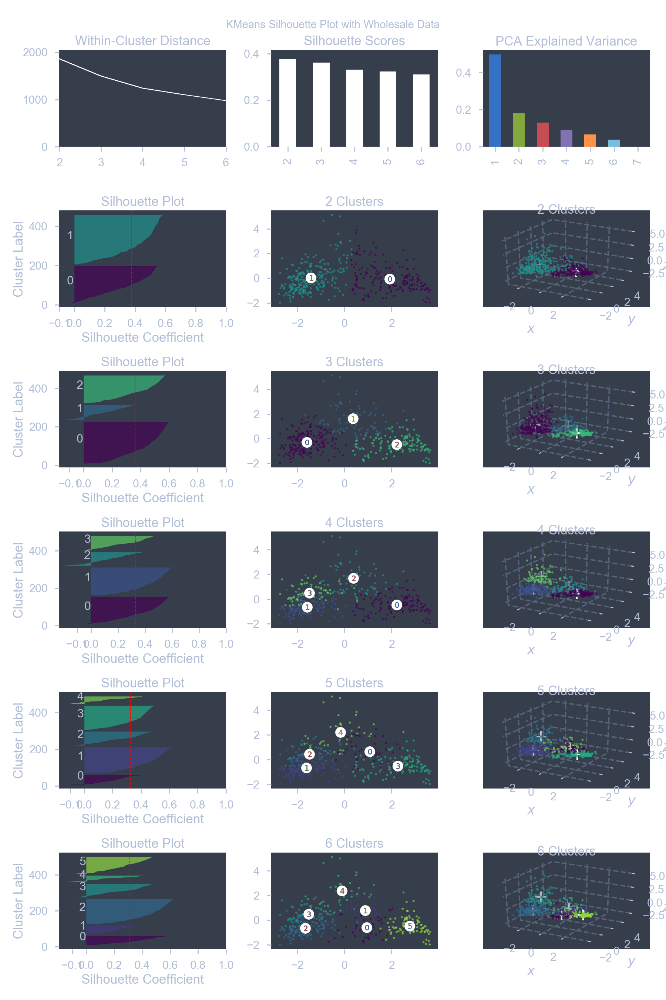

In [61]:
basket_shares_channel = data[['Channel']].sub(1).join(basket_shares)

basket_shares_channel_standardized = scaler.fit_transform(basket_shares_channel)

evaluate_clusters(basket_shares_channel_standardized)

### Also add total transaction value

<IPython.core.display.Javascript object>


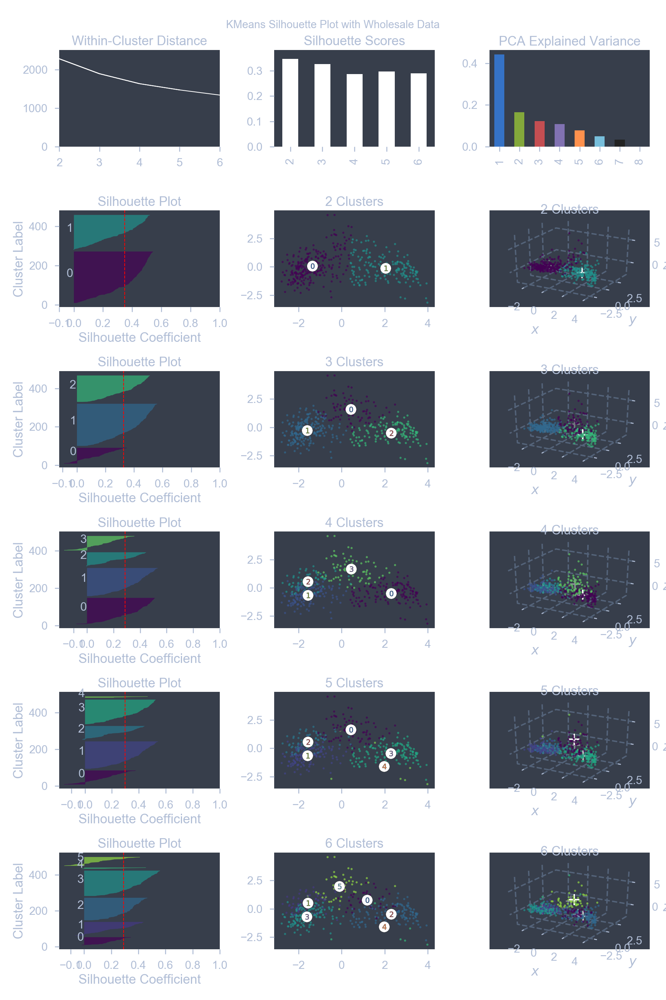

In [62]:
basket_shares_total = basket_shares_channel.join(transaction_value.to_frame('total'))

basket_shares_total_standardized = scaler.fit_transform(basket_shares_total)

evaluate_clusters(basket_shares_total_standardized)

### All data

<IPython.core.display.Javascript object>


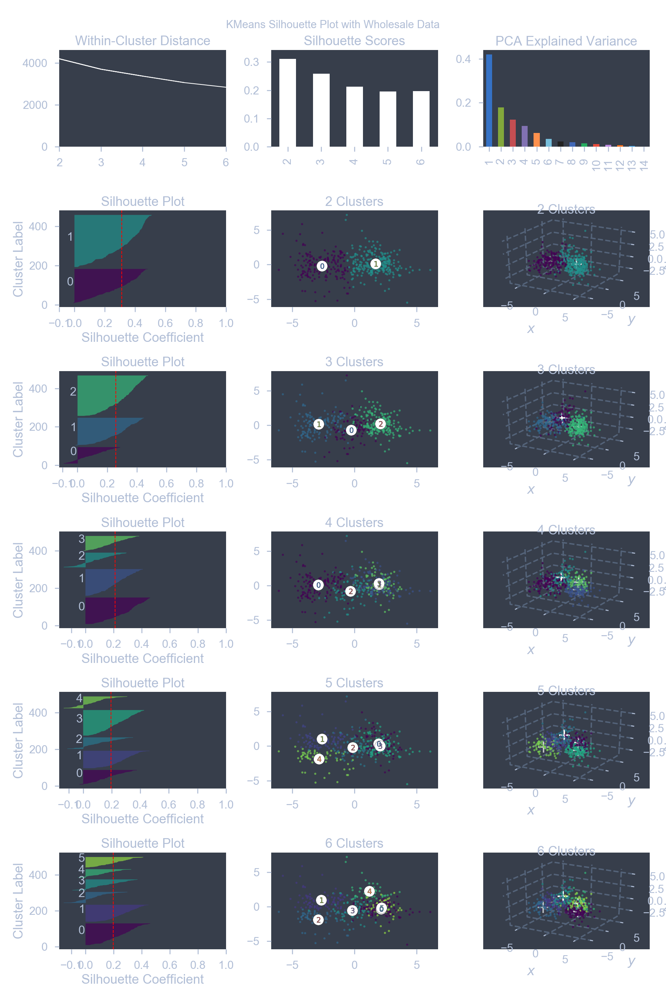

In [63]:
all_data = basket_shares_total.join(log_sales, rsuffix='_log')

all_data_standardized = scaler.fit_transform(all_data)

evaluate_clusters(all_data_standardized)

### Display centroids for log-transformed data

In [64]:
log_sales_channel_clean.head()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,Channel
0,9.45,9.18,8.93,5.37,7.89,7.20,1
1,8.86,9.19,9.17,7.47,8.10,7.48,1
2,8.76,9.08,8.95,7.79,8.17,8.97,1
3,9.49,7.09,8.35,8.76,6.23,7.49,0
4,10.03,8.60,8.88,8.27,7.48,8.55,1


#### Recompute Clusters

In [65]:
log_sales_channel_clean_standardized = scaler.fit_transform(
                    log_sales_channel_clean)

kmeans = KMeans(n_clusters=2).fit(log_sales_channel_clean_standardized)
centroids = kmeans.cluster_centers_
centroids

array([[ 0.22271645, -0.49960264, -0.56899427,  0.25115098, -0.61449143,
        -0.06531333, -0.68195279],
       [-0.39403679,  0.88391237,  1.00668217, -0.44434405,  1.08717714,
         0.11555435,  1.20653185]])

### Transform back to feature space

In [66]:
centroids_rescaled = pd.DataFrame(scaler.inverse_transform(centroids), 
                                  columns=log_sales_channel_clean.columns)
centroids_rescaled

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,Channel
0,9.10,7.67,7.92,7.64,5.95,6.70,0.01
1,8.36,9.02,9.45,6.81,8.57,6.88,0.90


### Apply exponential function

In [67]:
centroids_rescaled.loc[:, products] = np.exp(
    centroids_rescaled.loc[:, products])
centroids_rescaled

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,Channel
0,"8,989.38","2,148.58","2,745.92","2,080.44",385.60,812.04,0.01
1,"4,278.54","8,233.93","12,663.85",906.07,"5,254.51",975.48,0.90


### Centroid Profiles 

In [68]:
centroids_rescaled.append(data.agg(['mean', 'median']))

,Channel,Delicatessen,Detergents_Paper,Fresh,Frozen,Grocery,Milk
0,0.01,812.04,385.60,"8,989.38","2,080.44","2,745.92","2,148.58"
1,0.90,975.48,"5,254.51","4,278.54",906.07,"12,663.85","8,233.93"
mean,0.32,"1,524.87","2,881.49","12,000.30","3,071.93","7,951.28","5,796.27"
median,0.00,965.50,816.50,"8,504.00","1,526.00","4,755.50","3,627.00"


In [69]:
pd.Series(kmeans.labels_).value_counts()

0    253
1    143
dtype: int64

In [70]:
kmeans.inertia_

1697.9833375529774

### Repeat for 3 Clusters

In [71]:
kmeans = KMeans(n_clusters=3).fit(log_sales_channel_clean_standardized)
centroids = kmeans.cluster_centers_
centroids

array([[-0.42030019,  0.90211936,  1.02962329, -0.51136   ,  1.13215782,
         0.08712611,  1.25707872],
       [ 0.65593012,  0.0159562 , -0.09728636,  0.78730887, -0.3315649 ,
         0.73049582, -0.58472292],
       [-0.07309686, -0.78627745, -0.82090039, -0.08182499, -0.75387615,
        -0.55881268, -0.69359519]])

### Profiles for 3 Centroids

In [77]:
centroids_rescaled = pd.DataFrame(scaler.inverse_transform(centroids), columns=log_sales_channel_clean.columns)
centroids_rescaled.loc[:, products] = np.exp(centroids_rescaled.loc[:, products])
centroids_rescaled.append(data.agg(['mean', 'median']))

,Channel,Delicatessen,Detergents_Paper,Fresh,Frozen,Grocery,Milk
0,0.93,947.76,"5,630.13","4,145.39",836.33,"12,948.86","8,380.80"
1,0.06,"1,819.64",595.32,"15,142.94","3,948.63","4,339.43","3,544.64"
2,0.01,492.36,311.33,"6,296.23","1,397.42","2,150.57","1,626.50"
mean,0.32,"1,524.87","2,881.49","12,000.30","3,071.93","7,951.28","5,796.27"
median,0.00,965.50,816.50,"8,504.00","1,526.00","4,755.50","3,627.00"


<IPython.core.display.Javascript object>


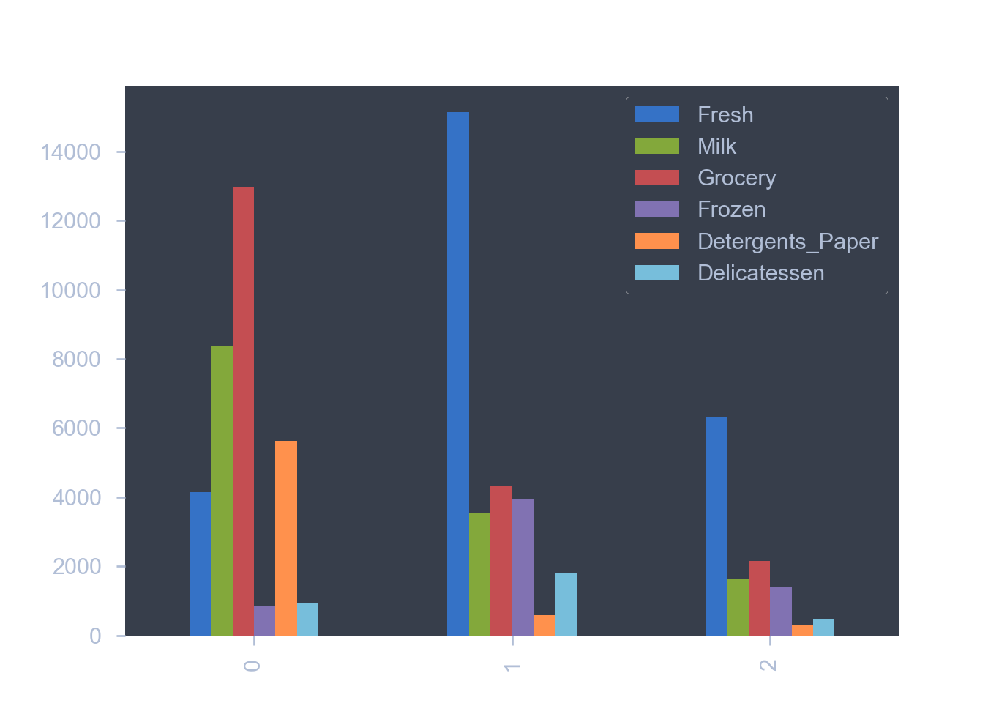

In [76]:
centroids_rescaled[products].plot.bar();

In [74]:
pd.Series(kmeans.labels_).value_counts()

2    157
0    135
1    104
dtype: int64

In [75]:
kmeans.inertia_

1441.2266769075504